# Algoritmes voor ontwerp van een nok


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.integrate as integrate
from scipy.fft import fft, fftfreq
import math
import matplotlib.animation as animation
from matplotlib.ticker import MultipleLocator, MaxNLocator


### Ontwerp van een nok

<a id="specs">Bewegingsspecificatie:</a>
Gegevens : De te ontwerpen nok moet volgende heffing kunnen realiseren :

- van 0° tot 120° : +25 mm
- van 120° tot 200° : -10 mm
- van 200° tot 270° : -15 mm

De equivalente massa en dempingsconstante van de volger (en bijhorende onderdelen) worden respectievelijk geschat op 5 kg en 0.058, terwijl het mechanisme volgende statische krachten moet uitoefenen:

- van 0°+ tot 120° : een lineair toenemende drukkracht van 0 N tot 60 N
- van 120° tot 200° : een konstante trek-kracht van 25 N
- van 200° tot 360° : zijn er geen statische krachten meer werkzaam

De gevraagde cyclustijd voor de bewerking uitgevoerd door de volger is 0.2 sec.

In [2]:
# specifications:

startangle1 = 0 # degrees
endangle1   = 120 # degrees
theta_seg1  = endangle1 - startangle1 # rotation length for first motion segment
startlift1  =  0
endlift1    = 25
motionlaw1  =  5

startangle2 =  120 # degrees
endangle2   = 200 # degrees
theta_seg2  = endangle2 - startangle2 # rotation length for second segment
startlift2  =  25
endlift2    =  15
motionlaw2  =   5

startangle3 = 200 # degrees
endangle3   = 270 # degrees
theta_seg3  = endangle3 - startangle3 # rotation length for third segment
startlift3  =  15
endlift3    =  0
motionlaw3  =   5

startangle4 = 270 # degrees
endangle4   = 360 # degrees
theta_seg4  = endangle4 - startangle4 # rotation length for fourth segment
startlift4  =  0
endlift4    =   0
motionlaw4  =   1

startangleload1 =  0
endangleload1   =  120
startload1      =  0
endload1        =  60

startangleload2 =  120
endangleload2   =  200
startload2      =  -25
endload2        =  -25

startangleload3 =  200
endangleload3   =  360
startload3      =  0
endload3        =  0

In [3]:
# Simulation variables of cam:

dtheta = 0.01 # resolution of simulation, in degrees

theta_deg      = np.arange(0,360,dtheta) # array of cam angles in degrees
theta          = theta_deg*np.pi/180     # array of cam angles in radians
lift           = np.zeros(len(theta))    # lift follower in mm
vel            = np.zeros(len(theta))    # velocity follower in mm/rad
vel_deg        = np.zeros(len(theta))    # velocity follower in mm/degree
acc            = np.zeros(len(theta))    # acceleration follower in mm/rad^2
acc_deg        = np.zeros(len(theta))    # acceleration follower in mm/degree^2
ext_load       = np.zeros(len(theta))    # external load in N
pressure_angle = np.zeros(len(theta))    # pressure angle in radians

# Cam design parameters, as output of the analysis
base_radius     = [] # base circle radius in mm
follower_radius = [] # follower radius in mm
exc             = [] # excentricity in mm
mass            = [] # equivalent mass in kg
spring_constant = [] # spring constant in N/mm
spring_preload  = [] # spring preload in N
rpm             = [] # rotations per minute of the cam
omega           = [] # angular velocity of the cam in rad/s

# search space of possible R0 values [mm]:
R0_min          =   0
R0_max          = 100 
R0_delta        =   0.1 
R0_vec          = np.arange(R0_min, R0_max, R0_delta) 
# maximum pressure angle corresponding to the evaluated R0s:
alpha_max       = np.zeros_like(R0_vec)

beta_vec        = np.arange(1, 360, 0.1)  # sampling resolution for rotation
rho_min         = np.zeros_like(beta_vec) # minimal follower radius at each beta

# input parameters of several analysis functions:
beta            = [] # cam angle interval of the segment
startangle      = [] # start angle of the segment in degrees
endangle        = [] # end angle of the segment in degrees
startlift       = [] # start lift of the segment in mm
endlift         = [] # end lift of the segment in mm
startangleload  = [] # start angle of the load in degrees
endangleload    = [] # end angle of the load in degrees
startload       = [] # start load in N
endload         = [] # end load in N
motionlaw       = [] # choice of motion law:
    # 1: dwell,
	  # 2: minimal rms acceleration,
	  # 3: harmonic,
	  # 4: cycloid,
	  # 5: 5th degree poly,
	  # 6: 7th degree poly

### 2. Bewegingswetten (genormaliseerd)

Elke bewegingswet werkt met een **genormaliseerde parameter** $\tau \in [0, 1]$ en geeft **dimensieloze** functies terug $(y, y', y'', y''')$. De werkelijke kinematica volgt via de **kettingregel**:

$$s = h \cdot y(\tau), \quad \dot{s} = \frac{h}{\beta}\cdot y'(\tau) \cdot \omega, \quad \ddot{s} = \frac{h}{\beta^2}\cdot y''(\tau) \cdot \omega^2$$

waarbij $h$ de heffing [m] en $\beta$ de nokhoekinterval [rad] van het segment is.

#### Gekozen bewegingswet: 5e-graads polynoom

$$y(\tau) = 10\tau^3 - 15\tau^4 + 6\tau^5$$

**Eigenschappen:**
- Continu tot en met de **versnellingscurve** (klasse $C^2$): geen schokken in $\ddot{s}$
- De ruk $\dddot{s}$ heeft eindige sprongen aan de segmentranden — acceptabel
- Goede balans tussen piekversnelling en zachtheid

> **Trade-off (mondelinge vraag):** Waarom geen cycloid? De cycloid heeft een lagere piekversnelling, maar een hogere ruk. De 5e-graads polynoom heeft een hogere piekversnelling maar is "zachter" voor het mechanisme. De keuze hangt af van de gevoeligheid voor trilling vs. piekbelasting op de motor.

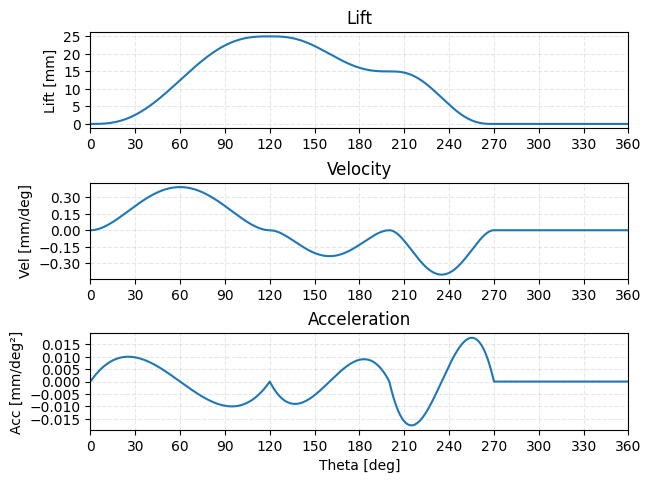

In [4]:
# compute motion functions:

# a motion segment runs in one periodic cycle
# from "startangle" till "endangle",
# and moves from "startlift" till "endlift",
# with a given "motionlaw", and
# with interpolation resolution "dtheta":

def addMotionSegment(startangle,endangle,startlift,endlift,motionlaw,dtheta):
    assert startangle - endangle < 0, 'End angle should be bigger than start angle'
    start_index = int(startangle/dtheta)
    end_index = int(endangle/dtheta)
    beta = endangle - startangle
    L0 = startlift
    L1 = endlift
    x = np.linspace(0, 1, (end_index - start_index))
    if motionlaw == 1:  # dwell
        assert L1 - L0 == 0, 'The given input does not represent a dwell'
        lift[start_index:end_index] = L0 * np.ones_like(x)
        vel_deg[start_index:end_index] = np.zeros_like(x)
        acc_deg[start_index:end_index] = np.zeros_like(x)

    elif motionlaw == 4:  # volle cycloide
        L = L1 - L0
        lift[start_index:end_index] = L * (x - np.sin(2 * np.pi * x) / (2 * np.pi)) + L0
        vel_deg[start_index:end_index] = L / beta * (1 - np.cos(2 * np.pi * x))
        acc_deg[start_index:end_index] = 2 * np.pi * L / beta**2 * np.sin(2 * np.pi * x)

    elif motionlaw == 5:  # 5th degree poly
        L = L1 - L0
        lift[start_index:end_index] = L0 + L * (6 * x**5 - 15 * x**4 + 10 * x**3)
        vel_deg[start_index:end_index] = L / beta * (30 * x**4 - 60 * x**3 + 30 * x**2)
        acc_deg[start_index:end_index] = L / beta**2 * (120 * x**3 - 180 * x**2 + 60 * x)

    vel = vel_deg*180/np.pi
    acc = acc_deg*(180/np.pi)**2

    return lift, vel_deg, acc_deg, vel, acc



def plotMotionLaw(t, lift, vel, acc):
    fig1, ax1 = plt.subplots(nrows=3, ncols=1, constrained_layout=True)
    fig1.suptitle("")
    
    # --- Lift ---
    ax1[0].plot(t, lift)
    ax1[0].set_title("Lift")
    ax1[0].set_ylabel("Lift [mm]")
    ax1[0].set_xlim([0, 360])
    ax1[0].xaxis.set_major_locator(MultipleLocator(30))
    ax1[0].yaxis.set_major_locator(MultipleLocator(5))
    ax1[0].grid(True, which='major', alpha=0.3, linestyle='--')
    
    # --- Velocity ---
    ax1[1].plot(t, vel)
    ax1[1].set_title("Velocity")
    ax1[1].set_ylabel("Vel [mm/deg]")
    ax1[1].set_xlim([0, 360])
    ax1[1].xaxis.set_major_locator(MultipleLocator(30))
    ax1[1].yaxis.set_major_locator(MaxNLocator(8))
    ax1[1].grid(True, which='major', alpha=0.3, linestyle='--')
    
    # --- Acceleration ---
    ax1[2].plot(t, acc)
    ax1[2].set_title("Acceleration")
    ax1[2].set_ylabel("Acc [mm/deg²]")
    ax1[2].set_xlabel("Theta [deg]")
    ax1[2].set_xlim([0, 360])
    ax1[2].xaxis.set_major_locator(MultipleLocator(30))
    ax1[2].yaxis.set_major_locator(MaxNLocator(8))
    ax1[2].grid(True, which='major', alpha=0.3, linestyle='--')

# Add all four segments to the motion law:
lift, vel_deg, acc_deg, vel, acc = addMotionSegment(startangle1,endangle1,startlift1,endlift1,motionlaw1,dtheta)
lift, vel_deg, acc_deg, vel, acc = addMotionSegment(startangle2,endangle2,startlift2,endlift2,motionlaw2,dtheta)
lift, vel_deg, acc_deg, vel, acc = addMotionSegment(startangle3,endangle3,startlift3,endlift3,motionlaw3,dtheta)
lift, vel_deg, acc_deg, vel, acc = addMotionSegment(startangle4,endangle4,startlift4,endlift4,motionlaw4,dtheta)


# Plot the motion law
plotMotionLaw(theta_deg,lift,vel_deg,acc_deg)

plt.show()

### Definieren van alle hulpfuncties

In [5]:
# utility functions for external load

def addLoadSegment(startangleload,endangleload,startload,endload,dtheta):
    assert startangleload - endangleload < 0, 'End angle should be bigger than start angle'
    start_index = int(startangleload/dtheta)
    end_index = int(endangleload/dtheta)
    theta_segment = theta_deg[start_index:end_index]
    ext_load[start_index:end_index] = (endload - startload)/(endangleload - startangleload)*(theta_segment - startangleload) + startload

    return ext_load

def plotExternalLoad(theta_deg,ext_load):
    plt.figure()
    plt.plot(theta_deg, ext_load)
    plt.xlabel('Theta [deg]')
    plt.ylabel('External load [N]')
    plt.xlim([0,360])
    plt.title('External load')


In [6]:
# utility functions for cam profile design (with eccentricity = 0!)

# relate sampled R0 values to pressure angle \alpha:
def Kloomok_Muffley_R0(beta,startlift,endlift,motionlaw):
    global R0_vec, alpha_max
    L0 = startlift
    L1 = endlift
    beta = beta * np.pi / 180
		# 100 samples in dimensionless "arc length" of motion law:
    x = np.arange(0, 1, 0.01)

    for i in range(len(R0_vec)):
        R0 = R0_vec[i]

        if motionlaw == 1:  # dwell
            assert L1 - L0 == 0, 'The given input does not represent a dwell'
            lift = L0 * np.ones_like(x)
            vel_ang = np.zeros_like(x)
            acc_ang = np.zeros_like(x)

        elif motionlaw == 4:  # volle cycloide
            L = L1 - L0
            lift = L * (x - np.sin(2 * np.pi * x) / (2 * np.pi)) + L0
            vel_ang = L / beta * (1 - np.cos(2 * np.pi * x))
            acc_ang = 2 * np.pi * L / beta**2 * np.sin(2 * np.pi * x)

        elif motionlaw == 5:  # 5th degree poly
            L = L1 - L0
            lift = L0 + L * (6 * x**5 - 15 * x**4 + 10 * x**3)
            vel_ang = L / beta * (30 * x**4 - 60 * x**3 + 30 * x**2)
            acc_ang = L / beta**2 * (120 * x**3 - 180 * x**2 + 60 * x)

        alpha = np.arctan2(vel_ang, R0 + lift)
        alpha_max[i] = np.max(np.abs(alpha)) * 180 / np.pi


# relate given R0 value to samples of curvature radii of motion law:
def Kloomok_Muffley_follower_radius(R0,span,startlift,endlift,motionlaw):
    global beta_vec, rho_min
    L0 = startlift
    L1 = endlift

    for i in range(len(beta_vec)):
        beta = beta_vec[i] * np.pi / 180
        theta = np.linspace(0, beta_vec[i], 100) * np.pi / 180
        x = theta / beta

        if motionlaw == 1:  # dwell
            assert L1 - L0 == 0, 'The given input does not represent a dwell'
            lift = L0 * np.ones_like(x)
            vel_ang = np.zeros_like(x)
            acc_ang = np.zeros_like(x)

        elif motionlaw == 4:  # volle cycloide
            L = L1 - L0
            lift = L * (x - np.sin(2 * np.pi * x) / (2 * np.pi)) + L0
            vel_ang = L / beta * (1 - np.cos(2 * np.pi * x))
            acc_ang = 2 * np.pi * L / beta**2 * np.sin(2 * np.pi * x)

        elif motionlaw == 5:  # 5th degree poly
            L = L1 - L0
            lift = L0 + L * (6 * x**5 - 15 * x**4 + 10 * x**3)
            vel_ang = L / beta * (30 * x**4 - 60 * x**3 + 30 * x**2)
            acc_ang = L / beta**2 * (120 * x**3 - 180 * x**2 + 60 * x)

        rho = ((R0 + lift)**2 + vel_ang**2)**(3/2) / ((R0 + lift)**2 + 2 * vel_ang**2 - (R0 + lift) * acc_ang)
        rho_min[i] = np.min(np.abs(rho))

    plt.figure()
    plt.plot(beta_vec, rho_min)
    plt.axvline(x=span, color='b')
    plt.text(span, 0.35*R0, 'span of this segment: (%s)'%(span), color='b', ha='right', va='center', rotation='vertical')
    plt.grid()
    plt.xlabel(r'rotation (degrees)')
    plt.ylabel(r'$\rho$ (mm)')
    plt.xlim([0, 360])
    plt.show()


In [7]:
# utility functions for pressure angle

def calculatePressureAngle(vel,exc,base_radius,follower_radius,lift):
    pressure_angle = np.arctan((vel-exc)/(np.sqrt((base_radius+follower_radius)**2-exc**2)+lift))
    return pressure_angle

def plotPressureAngle(theta_deg,pressure_angle):
    plt.figure()
    plt.plot(theta_deg, pressure_angle*180/np.pi)
    plt.xlabel('rotation [deg]')
    plt.ylabel('Pressure angle [deg]')
    plt.xlim([0,360])

In [8]:
# utility functions for curvature radius

def calculateRadiusCurvature(base_radius,follower_radius,exc,theta,lift,vel,acc):
    d = np.sqrt((base_radius + follower_radius)**2 - exc**2) #Nortron, Kinematic and dynamics of Machinery eq. 8.31c
    lambda_ = -theta - np.arctan2(exc, d+lift) + np.pi/2 # Nortron, Kinematic and dynamics of Machinery eq. 8.34, adapted for vertical follower instead of a horizontal one (--> + pi/2)
    dlambda = -1 + exc/((d+lift)**2 + exc**2) * vel # derivative of lambda with repect to theta
    ddlambda = exc/((d+lift)**2 + exc**2)*acc - 2*exc*(d+lift)*vel**2/((d+lift)**2 + exc**2)**2 # 2nd derivative of lambda with repect to theta

    g = np.sqrt((d+lift)**2 + exc**2) 
    dg = vel*(d+lift)/np.sqrt((d+lift)**2 + exc**2) # derivative of g with repect to theta
    ddg = (vel**2  + acc*(d + lift))/np.sqrt((d + lift)**2 + exc**2) - (vel**2*(d + lift)**2)/((d + lift)**2 + exc**2)**(3/2) # 2nd derivative of g with repect to theta

    h = np.sin(lambda_)
    dh = np.cos(lambda_)*dlambda # derivative of h with repect to theta
    ddh = -np.sin(lambda_)*dlambda**2 + np.cos(lambda_)*ddlambda # 2nd derivative of h with repect to theta
    f = np.cos(lambda_)
    df = -np.sin(lambda_)*dlambda #derivative of f with repect to theta
    ddf = -np.cos(lambda_)*dlambda**2 - np.sin(lambda_)*ddlambda # 2nd derivative of f with repect to theta

    dx = df*g + f*dg #derivative of x with repect to theta
    ddx = ddf*g + 2*df*dg + f*ddg # 2nd derivative of x with repect to theta
    dy = dh*g + h*dg # derivative of y with repect to theta
    ddy = ddh*g + 2*dh*dg + h*ddg # 2nd derivative of y with repect to theta

    roc_pitch = -(dx**2 + dy**2)**(3/2) / (dx*ddy - dy*ddx) # general forumula for the radius of curvature
    roc_cam = roc_pitch - follower_radius

    return roc_pitch, roc_cam

def plotRadiusCurvature(theta_deg,roc_pitch,roc_cam):
    inds = np.where(np.abs(np.diff(roc_pitch)/dtheta)<1e3)[0]
    maxi = max(10, max(roc_pitch[inds+1]))
    mini = min(-10, min(roc_pitch[inds+1]))
    plt.figure()
    plt.plot(theta_deg, roc_pitch)
    plt.plot(theta_deg, roc_cam)
    plt.xlabel('Theta [deg]')
    plt.ylabel('Radius of curvature [mm]')
    plt.xlim([0,360])
    plt.ylim([mini,maxi])
    plt.grid()
    plt.title('Radius of curvature')

def plotCamContour(base_radius,follower_radius,exc,theta,lift,pressure_angle,dtheta,):
    d = np.sqrt((base_radius + follower_radius)**2 - exc**2)
    lambda_ = -theta - np.arctan2(exc, d+lift) + np.pi/2
    xpitch = np.cos(lambda_)*np.sqrt((d+lift)**2 + exc**2)
    ypitch = np.sin(lambda_)*np.sqrt((d+lift)**2 + exc**2)

    xcam = xpitch + follower_radius*np.cos(-theta + pressure_angle + 3*np.pi/2)
    ycam = ypitch + follower_radius*np.sin(-theta + pressure_angle + 3*np.pi/2)

    pitch_curve = np.array([xpitch,ypitch])
    cam_curve = np.array([xcam,ycam])

    x_rolfol_center = exc  # x coordinate of the center of the roller of the follower
    y_rolfol_center = d + lift[0]  # y coordinate of the center of the roller of the follower
    x_rolfol = follower_radius * np.cos(theta) + x_rolfol_center  # x coordinate of the contour of the roller
    y_rolfol = follower_radius * np.sin(theta) + y_rolfol_center  # y coordinate of the contour of the roller

    min_distance_center_roller_to_bore = 2 * follower_radius
    height_bore = follower_radius

    width_block_on_follower = base_radius / 2
    height_block_on_follower = base_radius / 2

    x_boreleft = np.array([exc - 5, exc - 1, exc - 1, exc - 5])
    x_boreright = np.array([exc + 5, exc + 1, exc + 1, exc + 5])
    y_bore = np.array([d + max(lift) + min_distance_center_roller_to_bore] * 2 + [d + max(lift) + min_distance_center_roller_to_bore + height_bore] * 2)
    length_follower = y_bore[-1] - ypitch[0] - follower_radius + 0.2

    x_follower = np.array([x_rolfol_center, x_rolfol_center])
    y_follower = np.array([y_rolfol_center + follower_radius, y_rolfol_center + follower_radius + length_follower])

    x_block_on_follower = np.array([-width_block_on_follower, width_block_on_follower, width_block_on_follower, -width_block_on_follower]) + x_follower[0]
    y_block_on_follower = np.array([0, 0, height_block_on_follower, height_block_on_follower]) + y_follower[1]

    ref_line = np.array([[0, 0], [0, base_radius]])  # line, indicating the reference (= cam position = 0 degrees)

    x_pressangle = np.array([x_rolfol_center + follower_radius * np.sin(pressure_angle[0]), x_rolfol_center - follower_radius * np.sin(pressure_angle[0])])
    y_pressangle = np.array([y_rolfol_center - follower_radius * np.cos(pressure_angle[0]), y_rolfol_center + follower_radius * np.cos(pressure_angle[0])])

    plt.figure()
    plt.fill(cam_curve[0, ::int(1 / dtheta)], cam_curve[1, ::int(1 / dtheta)], 'b')
    plt.fill(x_rolfol[::int(1 / dtheta)], y_rolfol[::int(1 / dtheta)], 'g')
    plt.plot(pitch_curve[0, ::int(1 / dtheta)], pitch_curve[1, ::int(1 / dtheta)], '--r')
    plt.plot(0, 0, 'r+')
    plt.plot(x_pressangle, y_pressangle, 'r--')
    plt.plot(ref_line[0, :], ref_line[1, :], 'r--')
    plt.plot(x_boreleft, y_bore, 'r')
    plt.plot(x_boreright, y_bore, 'r')
    plt.plot(x_follower, y_follower, 'r')
    plt.fill(x_block_on_follower, y_block_on_follower, 'g')

    xlimits = [min(pitch_curve[0, :]), max(pitch_curve[0, :])]
    ylimits = [min(pitch_curve[1, :]), d + max(lift) + follower_radius + length_follower + height_block_on_follower]

    plt.xlim(np.array(xlimits) * 1.2)
    plt.ylim(np.array(ylimits) * 1.05)
    plt.gca().set_aspect('equal')
    plt.grid(True)
    plt.title('Cam contour [mm]')

def calculateForce(rpm, lift, spring_constant, spring_preload, pressure_angle, 
                   ext_load, mass, acc, vel, zeta=0.058):
    omega = rpm*2*np.pi/60
    c = 2*zeta*np.sqrt(spring_constant*mass)
    
    normalforce_spring = (lift*spring_constant + spring_preload)/np.cos(pressure_angle)
    normalforce_load   = ext_load/np.cos(pressure_angle)
    normalforce_acc    = mass*acc/1000*(omega**2)/np.cos(pressure_angle)
    normalforce_damp   = c*vel*omega/np.cos(pressure_angle)
    
    normalforce_tot = (normalforce_spring + normalforce_load 
                       + normalforce_acc + normalforce_damp)
    force_x = normalforce_tot * np.sin(pressure_angle)
    force_y = normalforce_tot * np.cos(pressure_angle)

    return (normalforce_tot, normalforce_acc, normalforce_load, 
            normalforce_spring, normalforce_damp, force_x, force_y)

def plotForces(theta_deg, normalforce_tot, normalforce_acc, normalforce_load, 
               normalforce_spring, normalforce_damp, force_x, force_y):
    plt.figure()
    plt.plot(theta_deg, normalforce_tot,   label='total')
    plt.plot(theta_deg, normalforce_acc,   '--r', label='acc')
    plt.plot(theta_deg, normalforce_load,  ':g',  label='extload')
    plt.plot(theta_deg, normalforce_spring,'-.m', label='spring')
    plt.plot(theta_deg, normalforce_damp,  '--c', label='damping')   # NIEUW
    plt.xlabel('Theta [deg]')
    plt.ylabel('Normal force [N]')
    plt.xlim([0, 360])
    plt.legend()
    plt.title('Normal force')

    plt.figure()
    plt.plot(theta_deg, force_x)
    plt.xlabel('Theta [deg]')
    plt.ylabel('Force x [N]')
    plt.xlim([0, 360])
    plt.title('Force x')

    plt.figure()
    plt.plot(theta_deg, force_y)
    plt.xlabel('Theta [deg]')
    plt.ylabel('Force y [N]')
    plt.xlim([0, 360])
    plt.title('Force y')


### Ontwerp van minimale steekcirkel $R_0$ via Kloomok-Muffley 

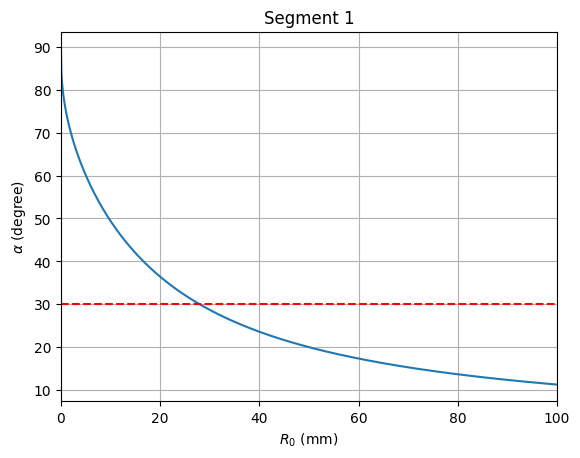

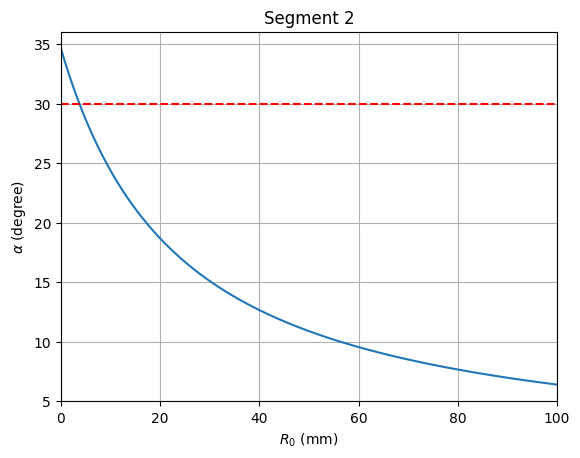

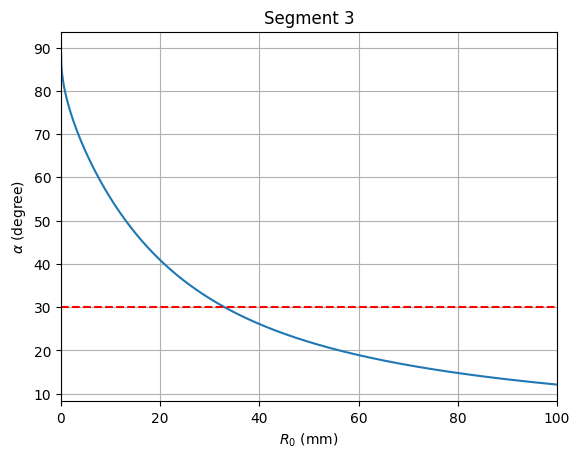

In [9]:
# parameter values for the needed motion segments

# a motion segment runs in one periodic cycle
# from "startangle" till "endangle",
# and moves from "startlift" till "endlift",
# with a given "motionlaw", and
# with interpolation resolution "dtheta":

# The approach was first described by M. Kloomok and R.V. Muffley,
# in Chapter 3 of Mabie, H.H., and Ocvirk, F.W., Mechanisms and Dynamics of Machinery, 1957

# segment 1:
Kloomok_Muffley_R0(theta_seg1,startlift1,endlift1,motionlaw1)

plt.plot(R0_vec, alpha_max)
plt.axhline(y=30, color='r', linestyle='--', label=r'$\alpha = 30°$')
plt.grid()
plt.title('Segment 1')
plt.xlabel('$R_0$ (mm)')
plt.ylabel(r'$\alpha$ (degree)')
plt.xlim([0, 100])
plt.show()

# segment 2:
Kloomok_Muffley_R0(theta_seg2,startlift2,endlift2,motionlaw2)

plt.figure()
plt.plot(R0_vec, alpha_max)
plt.axhline(y=30, color='r', linestyle='--', label=r'$\alpha = 30°$')
plt.grid()
plt.title('Segment 2')
plt.xlabel('$R_0$ (mm)')
plt.ylabel(r'$\alpha$ (degree)')
plt.xlim([0, 100])
plt.show()

# segment 3:
Kloomok_Muffley_R0(theta_seg3,startlift3,endlift3,motionlaw3)

plt.figure()
plt.plot(R0_vec, alpha_max)
plt.axhline(y=30, color='r', linestyle='--', label=r'$\alpha = 30°$')
plt.grid()
plt.title('Segment 3')
plt.xlabel('$R_0$ (mm)')
plt.ylabel(r'$\alpha$ (degree)')
plt.xlim([0, 100])
plt.show()



**Richtwaarde:** $|\alpha| < 30°$. Bij grotere drukhoeken neemt de wrijvingskracht snel toe en kan de volger blokkeren (zelfblokkering).

De drukhoek is de hoek tussen de **normaalkracht op de nok** en de **bewegingsrichting van de volger**. Met excentriciteit $e$:

$$\tan(\alpha) = \frac{\frac{ds}{d\theta} - e}{\sqrt{(R_0 + R_f)^2 - e^2} + s(\theta)}$$

> **Trade-off 1 — R₀ vergroten:** Een grotere basisstraal verkleint de drukhoek, maar neemt meer inbouwruimte en materiaalkosten. Itereer $R_0$ totdat $|\alpha|_{max} < 30°$.
>
> **Trade-off 2 — Excentriciteit e:** Het toevoegen van excentriciteit kan de drukhoek tijdens de **hefsslag** verlagen (asymmetrisch effect). Dit is "gratis" qua maatvoering maar maakt het mechanisme asymmetrisch: de drukhoek bij de terugkeerslag stijgt dan. Ideaal als de terugkeer minder kritisch is.

Uit bovenstaande plots besluiten we dat $R_0 = 40\text{mm}$ een geschikte waarde is.
<br>
(Op basis van alleen maar de vuistregel dat de maximum drukhoek $a_{\text{max}}$ best onder de 30 graden blijft)

In [10]:
R0 = 40  # pitch radius in mm 

### Ontwerp van straal $R_r$ van de volger, kiezen via kromtestraal

**Eis:** $\rho_{pitch} > R_f$ voor alle $\theta$. Als dit niet geldt $\rightarrow$ **ondersnijding**: de volger snijdt in het nokmateriaal en het mechanisme loopt vast.

De kromtestraal van de **pitch curve** (het pad van het rollermiddelpunt) is:

$$\rho_{pitch} = \frac{\left(s_{tot}^2 + \left(\frac{ds}{d\theta} - e\right)^2\right)^{3/2}}{s_{tot}^2 + 2\left(\frac{ds}{d\theta} - e\right)^2 - s_{tot} \cdot \frac{d^2s}{d\theta^2}}$$

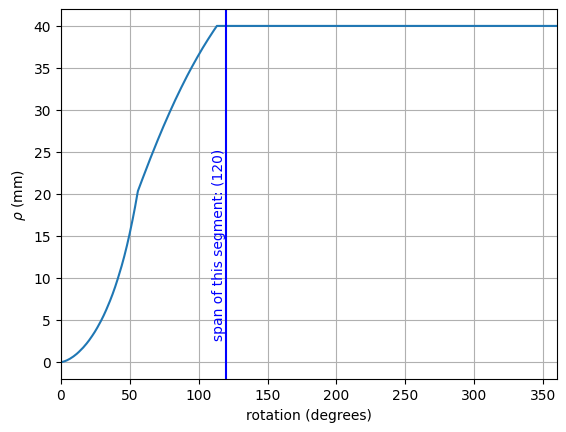

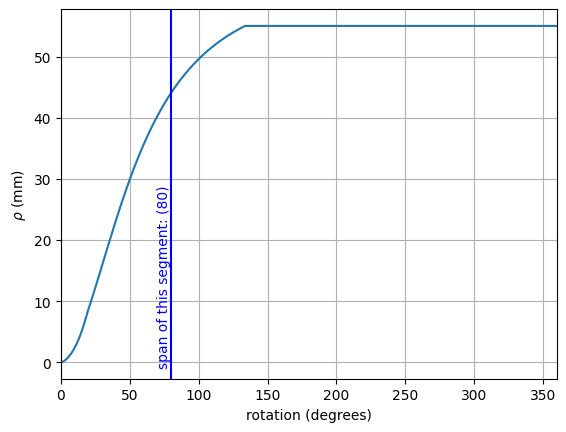

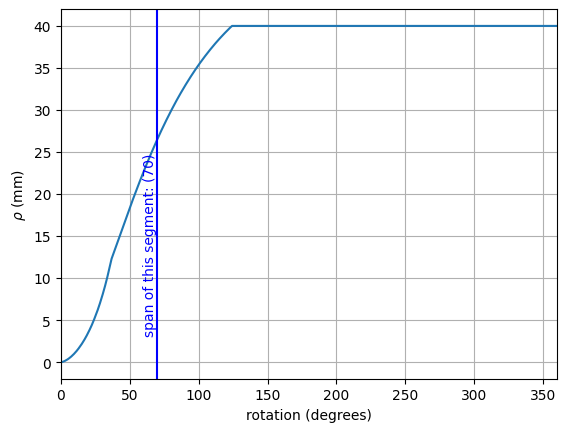

In [11]:
# compute R_r for all segments:

Kloomok_Muffley_follower_radius(R0,theta_seg1,startlift1,endlift1,motionlaw1)
Kloomok_Muffley_follower_radius(R0,theta_seg2,startlift2,endlift2,motionlaw2)
Kloomok_Muffley_follower_radius(R0,theta_seg3,startlift3,endlift3,motionlaw3)

From the plots above, we conclude that the follower radius $R_r$ must be smaller than $40$ mm (segment 1),
$45$ mm (segment 2) and $25$ mm (segment 3).  Let's choose $R_r = 15$ mm. And hence, the base radius of the cam is $R_0 - R_r = 25$ mm.

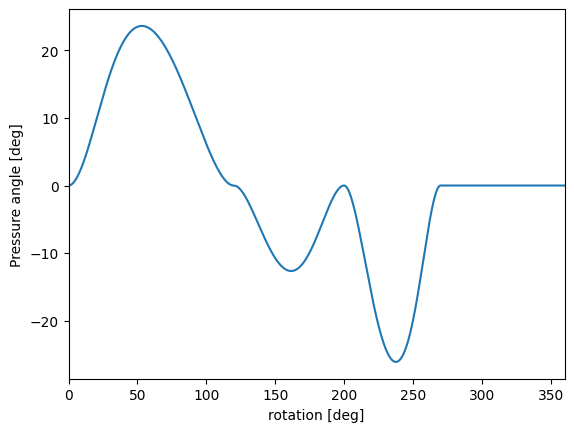

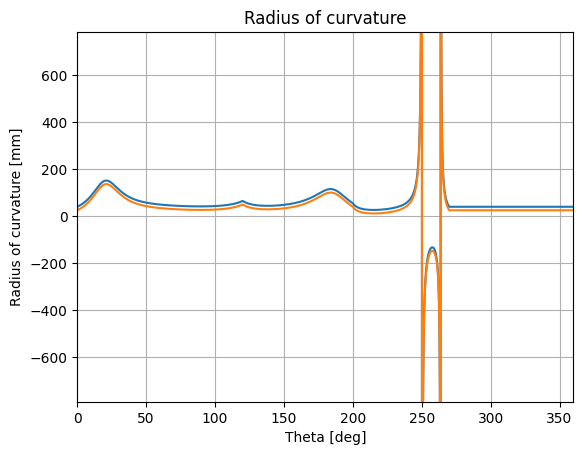

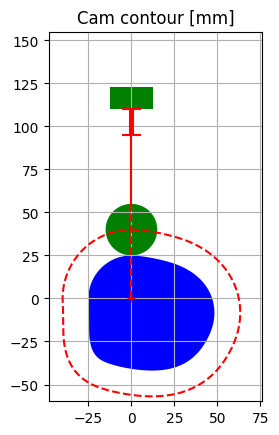

In [12]:
# Kinematics inputs
base_radius     = 25
follower_radius = 15
exc = 0 # try 20 too, to see the difference

# Calculate pressure angle
pressure_angle = calculatePressureAngle(vel,exc,base_radius,follower_radius,lift)
# Plot pressure angle
plotPressureAngle(theta_deg,pressure_angle)

# Calculate radius of curvature
roc_pitch, roc_cam = calculateRadiusCurvature(base_radius,follower_radius,exc,theta,lift,vel,acc)

# Plot the radius of curvature
plotRadiusCurvature(theta_deg,roc_pitch,roc_cam)

# Plot the cam contour
plotCamContour(base_radius,follower_radius,exc,theta,lift,pressure_angle,dtheta)

In [13]:
# ============================================================
# ANIMATIE — NOK + VOLGER
# ============================================================
import matplotlib.animation as animation
from IPython.display import HTML, display

# --- Stap 1: nokcontour eenmalig berekenen (zoals in plotCamContour) ---
d = np.sqrt((base_radius + follower_radius)**2 - exc**2)
lambda_ = -theta - np.arctan2(exc, d + lift) + np.pi/2

xpitch = np.cos(lambda_) * np.sqrt((d + lift)**2 + exc**2)
ypitch = np.sin(lambda_) * np.sqrt((d + lift)**2 + exc**2)

xcam = xpitch + follower_radius * np.cos(-theta + pressure_angle + 3*np.pi/2)
ycam = ypitch + follower_radius * np.sin(-theta + pressure_angle + 3*np.pi/2)

# --- Stap 2: figuur opzetten ---
fig_ani, ax_ani = plt.subplots(figsize=(7, 7))
ax_ani.set_aspect('equal')
ax_ani.grid(True)
ax_ani.set_xlabel('X [mm]')
ax_ani.set_ylabel('Y [mm]')
ax_ani.set_title('Animatie nok + volger')

lim_zone = base_radius + follower_radius + max(lift) * 1.5
ax_ani.set_xlim(-lim_zone, lim_zone)
ax_ani.set_ylim(-lim_zone, lim_zone * 1.3)  # iets extra boven voor de stem

cam_patch,    = ax_ani.plot([], [], 'b-', lw=2, label='Nokprofiel')
volger_roller = plt.Circle((0, 0), follower_radius, color='green', fill=False, lw=3)
ax_ani.add_patch(volger_roller)
volger_stem,  = ax_ani.plot([], [], 'k-', lw=5, label='Volger')
ax_ani.plot(0, 0, 'r+', markersize=10)  # nokas
ax_ani.legend(loc="upper left")
hoogte_tekst = ax_ani.text(0.02, 0.95, '', transform=ax_ani.transAxes,
                            fontsize=12, verticalalignment='top',
                            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

# --- Stap 3: animatieparameters ---
aantal_frames = 250
theta_anim = np.linspace(0, 4 * np.pi, aantal_frames)  # 2 volledige omwentelingen

# basisafstand van rollercentrum tot nokcentrum (bij lift = 0)
s_base = d

def init_anim():
    cam_patch.set_data([], [])
    volger_roller.center = (exc, s_base)
    volger_stem.set_data([], [])
    hoogte_tekst.set_text('')
    return cam_patch, volger_roller, volger_stem, hoogte_tekst

def frame_update(i):
    angle = theta_anim[i]
    
    cos_a = np.cos(angle)
    sin_a = np.sin(angle)
    x_rot = xcam * cos_a - ycam * sin_a
    y_rot = xcam * sin_a + ycam * cos_a
    cam_patch.set_data(x_rot, y_rot)
    
    theta_deg_interp = (np.rad2deg(angle)) % 360.0   # voor de lift-opzoeking (synchroon met nok)
    theta_deg_cur    = ( np.rad2deg(angle)) % 360.0   # voor de weergave (loopt 0 → 360)
    s_huidig = np.interp(theta_deg_interp, theta_deg, lift)
    Y_center = s_base + s_huidig
    
    volger_roller.center = (exc, Y_center)
    volger_stem.set_data([exc, exc],
                         [Y_center + follower_radius,
                          Y_center + follower_radius + 0.3 * base_radius])
    
    hoogte_tekst.set_text(f'θ = {theta_deg_cur:6.1f}°\nLift = {s_huidig:5.2f} mm')
    
    return cam_patch, volger_roller, volger_stem, hoogte_tekst

ani = animation.FuncAnimation(fig_ani, frame_update, frames=aantal_frames,
                              init_func=init_anim, blit=True, interval=30)
plt.close(fig_ani)
display(HTML(ani.to_jshtml()))

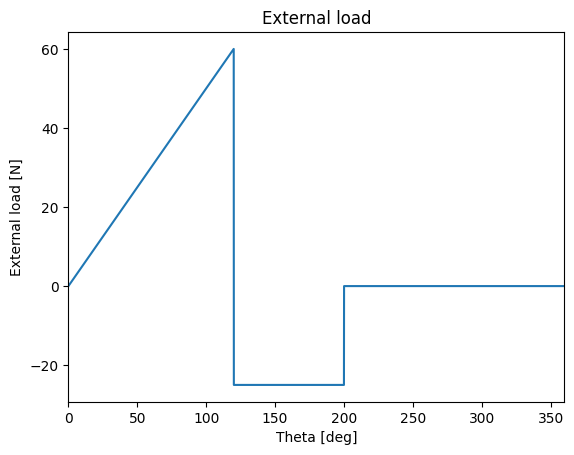

In [14]:
# generate external load

ext_load = addLoadSegment(startangleload1,endangleload1,startload1,endload1,dtheta)
ext_load = addLoadSegment(startangleload2,endangleload2,startload2,endload2,dtheta)
ext_load = addLoadSegment(startangleload3,endangleload3,startload3,endload3,dtheta)

plotExternalLoad(theta_deg,ext_load)

### Inverse dynamica: krachtenbalans zonder zwaartekracht en wrijving

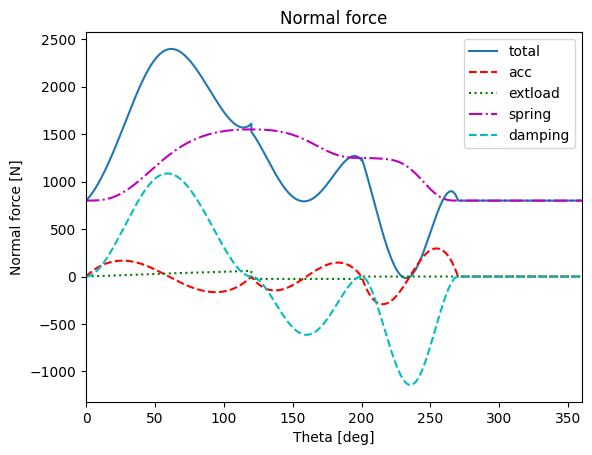

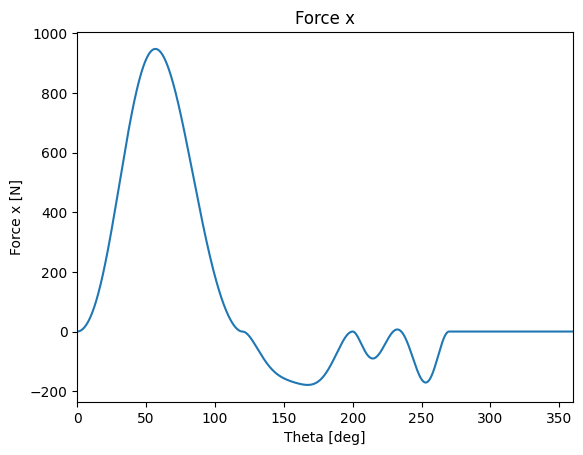

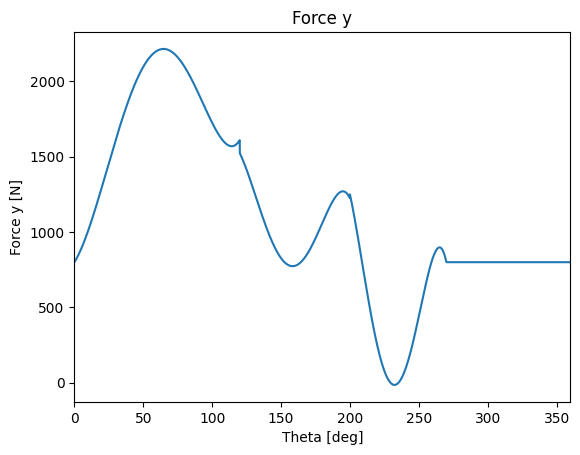

In [15]:
# spring design

# dynamic inputs
mass            =   5
spring_constant =  30
spring_preload  = 800
rpm             = 300

# Calculate forces (inclusief demping)
[normalforce_tot, normalforce_acc, normalforce_load, normalforce_spring,
 normalforce_damp, force_x, force_y] = calculateForce(
    rpm, lift, spring_constant, spring_preload, pressure_angle, 
    ext_load, mass, acc, vel)

# Plot forces
plotForces(theta_deg, normalforce_tot, normalforce_acc, normalforce_load, 
           normalforce_spring, normalforce_damp, force_x, force_y)

### 5. Inverse Dynamica: Krachtenbalans met zwaartekracht en wrijving

Via d'Alembert's principe schrijven we de evenwichtsvergelijking in de bewegingsrichting van de volger:

$$F_{nok,vert} = F_{inertie} + F_{demping} + F_{zwaartekracht} + F_{veer} + F_{extern}$$

met:
- $F_{inertie} = m \cdot \ddot{s}$
- $F_{demping} = c \cdot \dot{s}$
- $F_{zwaartekracht} = m \cdot g$
- $F_{veer} = k \cdot s + F_{preload}$
- $F_{extern}$: opgelegde productiekracht

De **normaalkracht** (loodrecht op het nokoppervlak) en **wrijvingskracht** (langs het oppervlak) volgen dan:

$$F_{normaal} = \frac{F_{nok,vert}}{\cos(\alpha) - \mu \cdot \text{sgn}(\dot{s}) \cdot \sin(\alpha)}$$

$$F_{wrijving} = \mu \cdot F_{normaal} \cdot |\tan(\alpha)| \cdot \text{sgn}(\dot{s})$$


De **absolute dempingsconstante** $c$ wordt afgeleid uit de dimensieloze relatieve demping $\zeta$ via:
$$c = \zeta \cdot 2\sqrt{k \cdot m}$$

> **Veerontwerp (mondelinge vraag):** Hoe kies je $F_{preload}$?
> De voorspanning moet **net groot genoeg** zijn zodat $F_{normaal} > 0$ overal in de cyclus (geen zweefgedrag). Te hoog kiezen is nefast: de normaalkracht stijgt onnodig, wat meer **wrijvingsverliezen** en een **grotere motorbelasting** geeft. In de praktijk kies je $F_{preload}$ zodat $\min(F_{normaal}) \approx 50{-}100$ N als veiligheidsmarge.


Berekende dempingsconstante c = 1.4207 N·s/mm

Beoordeling veercapaciteit:
  Minimale normaalkracht: 36.84 N
  Volger behoudt altijd contact met de nok.


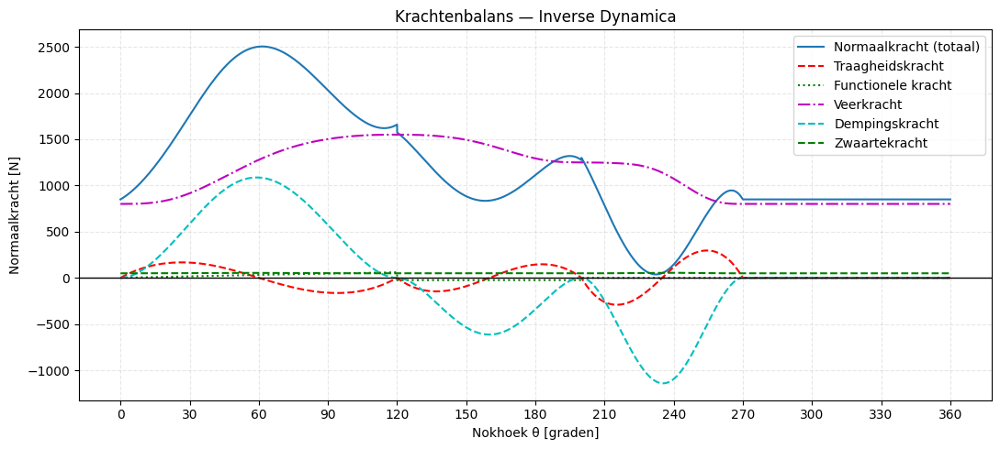

In [16]:
# --- Parameters ---
g       = 9.81          # m/s²  (zwaartekracht)
mu      = 0.05          # wrijvingscoëfficiënt nok-volger (typische waarde, pas aan)
zeta    = 0.058         # dimensieloze dempingsverhouding (uit opgave)
omega   = rpm * 2 * np.pi / 60   # hoeksnelheid nok [rad/s]

c_demping = 2 * zeta * np.sqrt(spring_constant * mass)
print(f"Berekende dempingsconstante c = {c_demping:.4f} N·s/mm")

# --- Omzetten naar fysische eenheden [mm/s] en [mm/s²] ---
v_ms  = vel  * omega          # snelheid   [mm/s]
a_ms2 = acc  * omega**2       # versnelling [mm/s²]

# --- Krachten [N] ---
F_traagheid   = mass * a_ms2 / 1000          # Newton (mass in kg, acc in mm/s² → /1000)
F_demping_kr  = c_demping * v_ms             # [N·s/mm * mm/s = N]
F_zwaar       = mass * g                     # gewichtskracht [N] (constant)
F_veer        = spring_constant * lift + spring_preload  # veerkracht [N]
F_functioneel = ext_load                     # al berekend in je code [N]

# Totale kracht langs de volger-as (positief = druk op nok)
F_som = F_traagheid + F_demping_kr + F_zwaar + F_veer + F_functioneel

# --- Normaalkracht en wrijving via drukhoek ---
V_sign = np.sign(v_ms)
noemer = 1.0 - mu * np.abs(np.tan(pressure_angle)) * V_sign
noemer = np.where(np.abs(noemer) < 1e-6, 1e-6, noemer)   # bescherming tegen deling door nul

F_nok_verticaal = F_som / noemer
F_wrijving      = mu * F_nok_verticaal * np.abs(np.tan(pressure_angle)) * V_sign
F_normaal_nok   = F_nok_verticaal / np.cos(pressure_angle)

# --- Beoordeling veercapaciteit ---
min_contact = np.min(F_normaal_nok)
print("\nBeoordeling veercapaciteit:")
print(f"  Minimale normaalkracht: {min_contact:.2f} N")
if min_contact <= 0:
    print("  Volger verliest contact! Verhoog spring_preload of spring_constant.")
else:
    print("  Volger behoudt altijd contact met de nok.")

# --- Plot ---
fig, ax = plt.subplots(figsize=(11, 5))

ax.plot(theta_deg, F_normaal_nok,                        label='Normaalkracht (totaal)')
ax.plot(theta_deg, F_traagheid / np.cos(pressure_angle), '--r',  label='Traagheidskracht')
ax.plot(theta_deg, F_functioneel / np.cos(pressure_angle), ':g', label='Functionele kracht')
ax.plot(theta_deg, F_veer / np.cos(pressure_angle),      '-.m',  label='Veerkracht')
ax.plot(theta_deg, F_demping_kr / np.cos(pressure_angle),'--c',  label='Dempingskracht')
ax.plot(theta_deg, F_zwaar / np.cos(pressure_angle),'--g',  label='Zwaartekracht')
ax.axhline(0, color='k', linewidth=1.0)

ax.set_ylabel('Normaalkracht [N]')
ax.set_xlabel('Nokhoek θ [graden]')
ax.set_title('Krachtenbalans — Inverse Dynamica')
ax.xaxis.set_major_locator(MultipleLocator(30))
ax.grid(True, alpha=0.3, linestyle='--')
ax.legend()
plt.tight_layout()
plt.show()

### 6. Aandrijfvermogen en Vliegwielontwerp

Vliegwiel op nokas en niet op motoras --> direct pieken en dalen opvangen van de nok zonder reductie van motoras --> nokas.

Het **aandrijfkoppel** op de nok-as volgt uit virtuele arbeid:

$$M(\theta) = F_{nok,vert} \cdot \frac{ds}{d\theta}$$

Het **gemiddeld vermogen** is:
$$P_{gem} = \frac{1}{2\pi} \int_0^{2\pi} M(\theta)\,\omega\,d\theta$$

#### Vliegwiel

Het vliegwiel absorbeert de **energiefluctuatie** $\Delta E$ tussen het gemiddeld koppel en het werkelijk koppel:
$$I_{vliegwiel} = \frac{\Delta E}{K_{gewenst} \cdot \omega^2}$$

waarbij $K_{gewenst} = 0.05$ de maximale toelaatbare snelheidsfluctuatie als fractie van $\omega$ is.

K = (ω_max - ω_min) / ω_gemiddeld

> **Mondelinge vraag — "Wat als T_cyclus = 0.25s (2× sneller)?"**
> - Het geometrisch nokprofiel **verandert niet**: $s(\theta)$ is puur geometrisch
> - $\omega$ verdubbelt → versnellingen stijgen **kwadratisch** ($\ddot{s} \propto \omega^2$)
> - Inertiële krachten verdubbelen kwadratisch → motor moet **4× meer koppelvermogen** leveren
> - Het vliegwiel moet ook groter: $I \propto \omega^{-2}$ (paradoxaal: kleinere $I$ nodig, maar het koppel is groter)
> - De "paradox" is dus: sneller draaien vereist een lichter vliegwiel maar een véél krachtigere motor. Het vliegwiel lost het koppelprobleem op, maar niet het vermogensprobleem.
> - **Beter alternatief?** Twee machines parallel → elk aan halve snelheid, kwart van de krachten (want F ∝ ω²)
> - 1. betere nokgeometrie: De eenvoudigste oplossing: kies een bewegingswet die minder energiefluctuatie geeft. Een cycloidale wet (motionlaw 4) geeft een vloeiendere kracht-tijdscurve dan de 5e-graads polynoom, wat ΔE verkleint en dus een kleiner vliegwiel nodig maakt — of helemaal geen.
> - 2. Tegennok: Plaats een tweede nok op dezelfde as, 180° verdraaid, die een tweede volger aandrijft. De energiepieken van nok 1 vallen dan samen met de dalen van nok 2 en omgekeerd.

- Energiepiek nodig?  → vliegwiel geeft energie af → motor draait constant
- Energie-dal?        → vliegwiel slaat energie op  → motor draait constant
- De motor levert altijd M_gemiddeld, het vliegwiel vult de rest aan. Hoe groter ΔE (fluctuatie), hoe zwaarder het vliegwiel moet zijn.

VLIEGWIELONTWERP — RESULTATEN
  Gemiddeld vermogen          P_gem  = 186.72 W
  Nominaal koppel             M_gem  = 5.94 Nm
  Energiefluctuatie           ΔE     = 40.8323 J
  Coëff. ongelijkmatigheid    K      = 0.05
  Vereiste vliegwieltraagheid I      = 0.827435 kg·m²


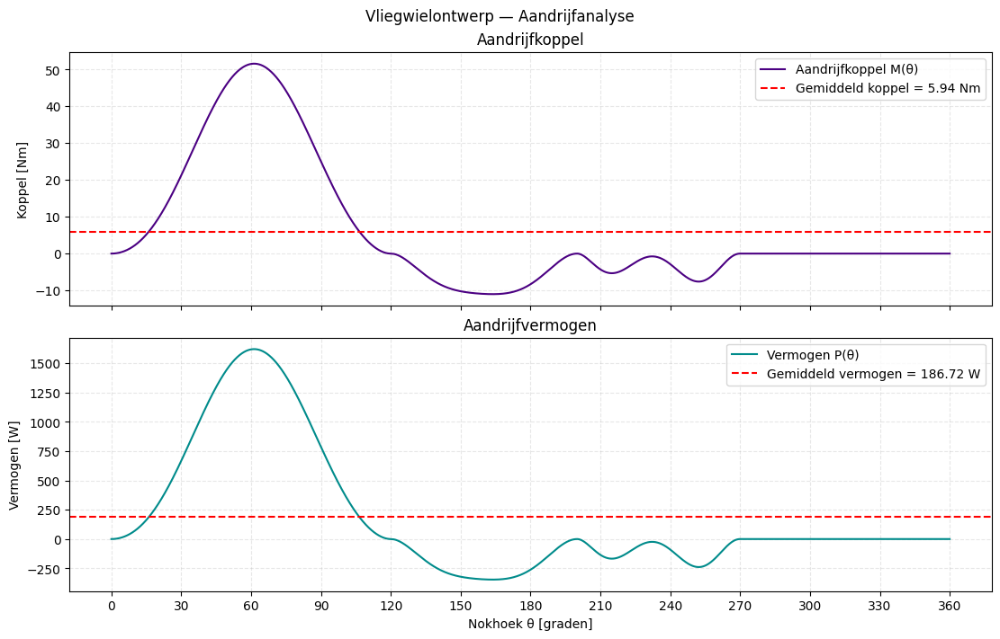

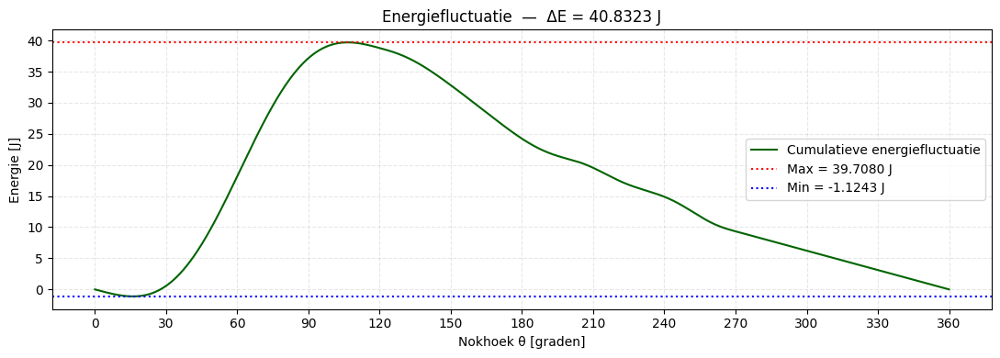

In [17]:
# Coëfficiënt van ongelijkmatigheid (jij kiest dit, pas aan naar wens)
K_gewenst = 0.05

# --- Aandrijfkoppel en vermogen ---
# F_nok_verticaal [N], v_ms [mm/s] → omzetten naar [m/s] voor Watt
M_aandrijf = F_nok_verticaal * (v_ms / 1000) / omega   # [N·m]
P_aandrijf = M_aandrijf * omega                         # [W]

# --- Gemiddeld vermogen en koppel via integratie over één cyclus ---
dtheta_rad  = theta[1] - theta[0]
P_gemiddeld = np.trapezoid(P_aandrijf, theta) / (2 * np.pi)
M_gemiddeld = P_gemiddeld / omega

# --- Energiefluctuatie via cumulatieve som ---
E_fluct = np.cumsum((M_aandrijf - M_gemiddeld) * dtheta_rad)
Delta_E = np.max(E_fluct) - np.min(E_fluct)

# --- Vereiste vliegwieltraagheid ---
I_vliegwiel = Delta_E / (K_gewenst * omega**2)

# --- Resultaten printen ---
print("=" * 55)
print("VLIEGWIELONTWERP — RESULTATEN")
print("=" * 55)
print(f"  Gemiddeld vermogen          P_gem  = {P_gemiddeld:.2f} W")
print(f"  Nominaal koppel             M_gem  = {M_gemiddeld:.2f} Nm")
print(f"  Energiefluctuatie           ΔE     = {Delta_E:.4f} J")
print(f"  Coëff. ongelijkmatigheid    K      = {K_gewenst}")
print(f"  Vereiste vliegwieltraagheid I      = {I_vliegwiel:.6f} kg·m²")
print("=" * 55)

# --- Plots ---
fig, (ax_koppel, ax_vermogen) = plt.subplots(2, 1, figsize=(11, 7),
                                              sharex=True, constrained_layout=True)
fig.suptitle("Vliegwielontwerp — Aandrijfanalyse")

# Koppel
ax_koppel.plot(theta_deg, M_aandrijf, label='Aandrijfkoppel M(θ)', color='indigo')
ax_koppel.axhline(M_gemiddeld, color='r', linestyle='--', label=f'Gemiddeld koppel = {M_gemiddeld:.2f} Nm')
ax_koppel.set_ylabel('Koppel [Nm]')
ax_koppel.set_title('Aandrijfkoppel')
ax_koppel.xaxis.set_major_locator(MultipleLocator(30))
ax_koppel.grid(True, alpha=0.3, linestyle='--')
ax_koppel.legend()

# Vermogen
ax_vermogen.plot(theta_deg, P_aandrijf, label='Vermogen P(θ)', color='darkcyan')
ax_vermogen.axhline(P_gemiddeld, color='r', linestyle='--', label=f'Gemiddeld vermogen = {P_gemiddeld:.2f} W')
ax_vermogen.set_ylabel('Vermogen [W]')
ax_vermogen.set_xlabel('Nokhoek θ [graden]')
ax_vermogen.set_title('Aandrijfvermogen')
ax_vermogen.xaxis.set_major_locator(MultipleLocator(30))
ax_vermogen.grid(True, alpha=0.3, linestyle='--')
ax_vermogen.legend()

plt.show()

# --- Energiefluctuatie plot ---
fig2, ax_E = plt.subplots(figsize=(11, 4))
ax_E.plot(theta_deg, E_fluct, color='darkgreen', label='Cumulatieve energiefluctuatie')
ax_E.axhline(np.max(E_fluct), color='r', linestyle=':', label=f'Max = {np.max(E_fluct):.4f} J')
ax_E.axhline(np.min(E_fluct), color='b', linestyle=':', label=f'Min = {np.min(E_fluct):.4f} J')
ax_E.set_ylabel('Energie [J]')
ax_E.set_xlabel('Nokhoek θ [graden]')
ax_E.set_title(f'Energiefluctuatie  —  ΔE = {Delta_E:.4f} J')
ax_E.xaxis.set_major_locator(MultipleLocator(30))
ax_E.grid(True, alpha=0.3, linestyle='--')
ax_E.legend()
plt.tight_layout()
plt.show()

### vraag 6: Mogelijke singulariteiten?
> - als drukhoek alpha = 90° --> krachtenoverdracht onmogelijk
> - als mu ¨|tan(alpha)| = 1 --> noemer F_normaal wordt 0 --> oneindig --> mechanisme blokkeert
> - als er ondersnijding is rho_pitch = R_r --> roller raakt niet meer netjes het profiel
> - contactverlies minimale normaalkracht =< 0
> - Als heffing negatief is, kan niet, rollercentrum zou samen of achter nokas vallen --> onmogelijk

### vraag 7: Wat zijn de onbalans-eigenschappen van je ontwerp?
> - Een draaiend lichaam is gebalanceerd wanneer zijn massa symmetrisch verdeeld is rond de rotatie-as. Bij onbalans valt het massamiddelpunt niet samen met de rotatie-as, wat een centrifugale kracht veroorzaakt: F_onbalans​=m⋅e⋅ω^2
> - nok is in statische onbalans
> - berekening F onbalans?
> - gevolg van onbalansen: trillingen (lager voelt cyclisch wisselende kracht --> vibratie van frame), vermoeiing door wisselende belasting, geluid, precisieverlies
> - oplossen met tegengewicht aan andere kant van de as of materiaalverwijdering (boren of frezen aan uitstulpingskant)

### vraag 8: 